In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn import preprocessing as preprocessing
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
from PIL import Image
from tqdm import tqdm, trange
from tensorboardX import SummaryWriter
from concurrent.futures import ThreadPoolExecutor
import time

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.figure import figaspect

import scipy.ndimage as ndimage
from scipy.optimize import curve_fit
from scipy.stats import multivariate_normal
import scipy.stats as stats
from scipy.ndimage import gaussian_filter, zoom
from absl import app, flags
from IPython import get_ipython
from IPython.display import clear_output
from skimage import io, morphology, filters, util

import gc 
from absl import app, flags
import datetime
import os
import sys
import cv2
from IPython.display import clear_output
from IPython import get_ipython
import random
import pandas as pd
import torch.multiprocessing as mp

if __name__ == '__main__':
    mp.set_start_method('spawn', force=True) # Add this line

## Prepare Background Tiles

Loaded background: (6985, 8192), range: [58.0, 153.0]
Generated 208 tiles of size (512, 512)


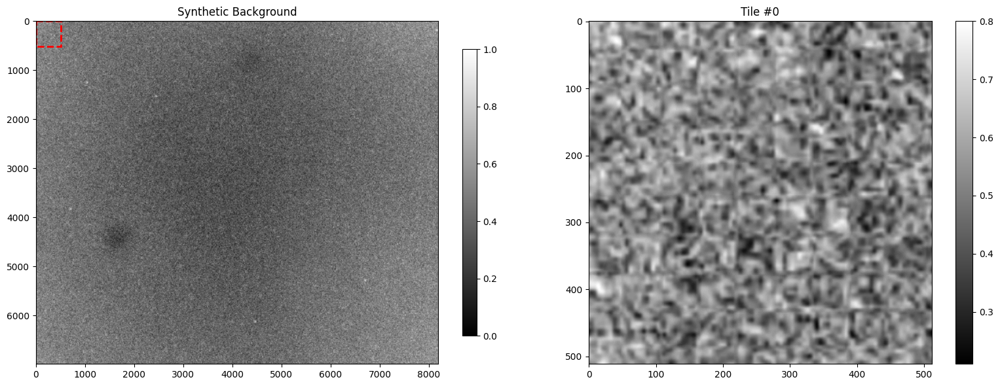

In [4]:
from PIL import Image
Image.MAX_IMAGE_PIXELS = None

def standardize_image(image):
    """
    Standardize the pixel values of a 16-bit image so that the resulting image
    has a mean of 0 and a standard deviation of 1.

    Parameters:
    - image: A NumPy array representing the 16-bit input image.

    Returns:
    - A NumPy array of the standardized image.
    """
    image = image.astype(np.float32) / 255.
    mean = np.mean(image)
    std = np.std(image)
    standardized_image = (image - mean) / std
    print(f"mean: {mean}, std: {std}")
    return standardized_image

def shadow_remove(img):     
    """
    (Explanation needed)

    Parameters:
    - image: A NumPy array representing the 16-bit input image.

    Returns:
    - A NumPy array of the shadow removed image.
    """   
    dilated_img = morphology.dilation(img, morphology.square(11))
    bg_img = filters.median(dilated_img, morphology.disk(31))
    shadowremov = img - bg_img
    return shadowremov

def save_image(image):
    print(image.dtype)
    # Before saving, rescale and convert the processed image back to 16-bit
    final_img_16bit = rescale_to_16bit(image)
    cv2.imwrite('background_subtracted.png', final_img_16bit)

def rescale_to_16bit(image_float, target_range=(0, 65535)):
    """
    Rescales a floating-point image to the specified 16-bit range.

    Parameters:
    - image_float: A NumPy array of the image in floating-point format.
    - target_range: A tuple specifying the desired output range (min, max).

    Returns:
    - A NumPy array of the image rescaled to the 16-bit range.
    """
    min_val = np.min(image_float)
    max_val = np.max(image_float)
    scale = (target_range[1] - target_range[0]) / (max_val - min_val)
    image_16bit = (image_float - min_val) * scale + target_range[0]
    return image_16bit.astype(np.uint16)

def visualize_image(images, labels, backgrounds, image_index=0, figsize=(2000, 800)):
    """
    Visualize the images. 
    - image:            Number of training images generated. 
                        (num_imgs, 1, img_width, img_height)
    - background:       Previously generated "bg_tiles" is used. 
                        (num_imgs, 1, img_width, img_height)
    - labels:           One-hot representation of the center of the PSFs. 
                        (num_imgs, 1, img_width, img_height)
    - labels_density:   When "labels" are the one-hot representation, "label_density" has pixel value of 100 followed by smoothing with gaussian filter 
                        (num_imgs, 1, img_width, img_height)
    - image_index:      For sanity check, a single image from the training set is displayed. 
                        (int)
    - figsize:          Size of the figure. 
                        ex) (1000, 1000)
                        
    Returns:
    - None
    """   

    if labels.ndim == 3:
        labels = labels.unsqueeze(0)
        backgrounds = backgrounds.unsqueeze(0)
    if images.ndim == 3:
        images = images.unsqueeze(0)
    
    print(f"image index: {image_index}")
    num_imgs, img_channel, img_size_x, img_size_y = images.shape
    px = 1/plt.rcParams['figure.dpi'] 
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(figsize[0]*px, figsize[1]*px))

    for i, ax in enumerate(axes.flatten()):
        D = np.squeeze(images[image_index, ...] )
        if not i % 4:
            GT = np.squeeze(labels[image_index, 2, ...] > 0)
            BG = np.squeeze(backgrounds[image_index, 0, ...])
            a = ax.imshow(D, origin='lower', cmap='gray')
            ax.set_title('Input Image')
        if i%4 == 1:
            a = ax.imshow(BG, origin='lower', cmap='gray')
            ax.set_title('Input Background')
        if i%4 == 2:
            a = ax.imshow(GT, origin='lower', cmap='gray')
            ax.set_title('Ground Truth Center')
            
        fig.colorbar(a, ax=ax, fraction=0.046)
        ax.set_xlim([0, img_size_x])
        ax.set_ylim([img_size_y, 0])

    plt.tight_layout()
    plt.show()
    
def prepare_background_tiles(bg_image_path, window_size):
    """
    Load a synthetic background image and tile it.
    
    Parameters:
    - bg_image_path: Path to the synthetic background image
    - window_size: Tuple (height, width) for each tile
    
    Returns:
    - bg_tiles: NumPy array of shape (num_tiles, height, width)
    """
    # Load image
    bg_image = np.asarray(Image.open(bg_image_path).convert('L')).astype(np.float32)
    print(f"Loaded background: {bg_image.shape}, range: [{bg_image.min():.1f}, {bg_image.max():.1f}]")
    
    # Normalize to 0-1
    bg_image = (bg_image - bg_image.min()) / (bg_image.max() - bg_image.min())
    
    bg_height, bg_width = bg_image.shape
    bg_tiles = []
    
    # Tile the image
    for i in range(int(bg_height / window_size[0])):
        for j in range(int(bg_width / window_size[1])):
            bg_tile = bg_image[i*window_size[0] : i*window_size[0] + window_size[0], 
                               j*window_size[1] : j*window_size[1] + window_size[1]]
            bg_tiles.append(bg_tile)
    
    bg_tiles = np.asarray(bg_tiles)
    print(f"Generated {len(bg_tiles)} tiles of size {window_size}")
    
    # Visualization
    index = 0
    fig, subplots = plt.subplots(1, 2, figsize=(16, 6))
    subplots[0].set_title("Synthetic Background")
    subplot_0 = subplots[0].imshow(bg_image, cmap='gray')
    rect = patches.Rectangle((window_size[1] * (index % int(bg_width / window_size[1])), 
                               window_size[0] * (index // int(bg_width / window_size[1]))), 
                              window_size[1], window_size[0], linewidth=2, linestyle='--', 
                              edgecolor='r', facecolor='none')
    subplots[0].add_patch(rect)
    fig.colorbar(subplot_0, ax=subplots[0], fraction=0.03)
    subplot_1 = subplots[1].imshow(bg_tiles[index].squeeze(), cmap='gray')
    subplots[1].set_title(f"Tile #{index}")
    fig.colorbar(subplot_1, ax=subplots[1], fraction=0.05)
    plt.tight_layout()
    plt.show()
    
    return bg_tiles

if __name__ == '__main__':
    os.chdir('C:/Users/hankeun2/OneDrive - University of Illinois - Urbana/04. LOCA-PRAM/brian_test/')
    
    # Your synthetic background
    bg_image_path = 'cropped_center_synth.png'
    
    # Larger window for 150px particles (was 84x84)
    window_size = (512, 512)
    
    bg_tiles = prepare_background_tiles(bg_image_path, window_size)

## Authentic Image for Testing
### Sanity Check

In [5]:
# Cell 4: Load new synthetic background
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
window_size = (512, 512)

bg_image_path = 'cropped_center.png'  # ← your new file name
bg_image = np.asarray(Image.open(bg_image_path).convert('L')).astype(np.float32)

bg_height, bg_width = bg_image.shape
bg_tiles = []
for i in range(bg_height // window_size[0]):
    for j in range(bg_width // window_size[1]):
        tile = bg_image[i*window_size[0]:(i+1)*window_size[0],
                        j*window_size[1]:(j+1)*window_size[1]]
        bg_tiles.append(tile)

bg_tiles = np.asarray(bg_tiles)
print(f"Loaded {len(bg_tiles)} real background tiles of size {window_size}")
print(f"Tile value range: [{bg_tiles.min():.1f}, {bg_tiles.max():.1f}]")

Loaded 208 real background tiles of size (512, 512)
Tile value range: [0.0, 45.0]


## Training Data Generation

In [14]:
def generate_simulation_image(img_size, bg_tiles, num_gaus_low=1, num_gaus_high=12, labels_channel=3):
    """
    Generates a simulated image with synthetic PSF particles.
    OPTIMIZED: Uses vectorized NumPy broadcasting instead of scipy.stats.multivariate_normal.
    """
    
    # Select a random background tile (dummy tile in this setup)
    bg_idx = np.random.randint(0, len(bg_tiles))
    gauss_base = bg_tiles[bg_idx].copy()
    
    # 1. Apply Randomized Offset (Background Level)
    # Mean: 223.05, STD: 3.48
    #offset_val = np.random.normal(loc=223.050, scale=3.484)
    #gauss_base += offset_val 

    # Pre-compute coordinate vectors (1D is fast)
    x_vec = np.arange(img_size[1])
    y_vec = np.arange(img_size[0])

    # Initialize Label Maps
    labels = np.zeros((labels_channel, img_size[0], img_size[1]))
    
    # Determine number of particles (Max 12 based on previous discussion)
    num_particles = np.random.randint(num_gaus_low, num_gaus_high)

    for _ in range(num_particles):
        # 2. Sample Amplitude
        amplitude = np.random.normal(loc=10, scale=1.544) #loc was 9.741, scale was 2.544    # second, was 16 1.544
        if amplitude < 1.0: amplitude = 1.0 
        
        # 3. Sample Position (Center)
        margin = 50
        x_c = np.random.uniform(margin, img_size[1] - margin)
        y_c = np.random.uniform(margin, img_size[0] - margin)
        
        # 4. Sample Sigma (Widths)
        raw_sigma_x = np.random.normal(loc=42.988, scale=6.914)
        raw_sigma_y = np.random.normal(loc=30.363, scale=4.809)
        
        sigma_min = 10.0
        sigma_x = max(sigma_min, raw_sigma_x)
        sigma_y = max(sigma_min, raw_sigma_y)

        # --- OPTIMIZED GENERATION START ---
        # Instead of generic 2D multivariate, use separable 1D Gaussians
        # G(x,y) = A * exp(-(x-xc)^2 / 2sx^2) * exp(-(y-yc)^2 / 2sy^2)
        
        # Calculate 1D components
        g_x = np.exp(-((x_vec - x_c)**2) / (2 * sigma_x**2))
        g_y = np.exp(-((y_vec - y_c)**2) / (2 * sigma_y**2))
        
        # Outer product to create 2D particle
        # shape (H, 1) * shape (1, W) -> shape (H, W)
        particle = np.outer(g_y, g_x)
        
        # Scale by amplitude (Peak of np.exp is 1.0, so just multiply)
        particle = particle * amplitude
        # --- OPTIMIZED GENERATION END ---
            
        gauss_base -= particle
        
        # Update Labels
        ix, iy = int(x_c), int(y_c)
        if 0 <= ix < img_size[1] and 0 <= iy < img_size[0]:
            labels[0, iy, ix] = x_c - ix 
            labels[1, iy, ix] = y_c - iy
            labels[2, iy, ix] = 1.0       

    # 5. Add Noise (RMSE)
    #noise_level = np.random.normal(loc=2.670, scale=0.234)
    #noise_level = max(0.1, noise_level) 
    #noise = np.random.normal(0, noise_level, gauss_base.shape)
    #gauss_base += noise

    # Clip to valid range
    gauss_base = np.clip(gauss_base, 0, 65535)

    return gauss_base, labels, bg_tiles[bg_idx]

class GaussianDataset(Dataset):
    def __init__(self, num_batches, bg_tiles, img_size=(512, 512), transform=None):
        self.num_batches = num_batches
        self.bg_tiles = bg_tiles
        self.img_size = img_size
        self.transform = transform

    def __len__(self):
        return self.num_batches

    def __getitem__(self, idx):
        # Generate simulated data
        image, labels, bg_image = generate_simulation_image(
            img_size=self.img_size, 
            bg_tiles=self.bg_tiles, 
            num_gaus_low=0,   # Adjust min particles
            num_gaus_high=6  # Adjust max particles
        )
        
        # Standardize / Normalize
        image = (image - np.mean(image)) / (np.std(image) + 1e-6)
        
        # Convert to Tensor
        image = torch.from_numpy(image).float().unsqueeze(0) # (1, H, W)
        labels = torch.from_numpy(labels).float()            # (C, H, W)
        bg_image = torch.from_numpy(bg_image).float().unsqueeze(0)
        
        return image, labels, bg_image

In [15]:
tile = bg_tiles[0]
print(f"Tile mean: {tile.mean():.1f}")
print(f"Tile std:  {tile.std():.1f}")
print(f"Tile local std (32x32 patches):")
for y in range(0, 512, 128):
    for x in range(0, 512, 128):
        patch = tile[y:y+32, x:x+32]
        print(f"  ({y},{x}): std={patch.std():.2f}")
print(f"Particle amplitude: ~10")
print(f"Noise level: ~2.7")

Tile mean: 32.0
Tile std:  2.9
Tile local std (32x32 patches):
  (0,0): std=3.09
  (0,128): std=3.16
  (0,256): std=2.02
  (0,384): std=1.89
  (128,0): std=2.32
  (128,128): std=2.49
  (128,256): std=2.35
  (128,384): std=2.44
  (256,0): std=2.47
  (256,128): std=1.45
  (256,256): std=3.09
  (256,384): std=2.26
  (384,0): std=2.80
  (384,128): std=2.18
  (384,256): std=2.23
  (384,384): std=4.01
Particle amplitude: ~10
Noise level: ~2.7


### Asynchronous Dataset Loading

Visual comparison: Background vs Background+Particles


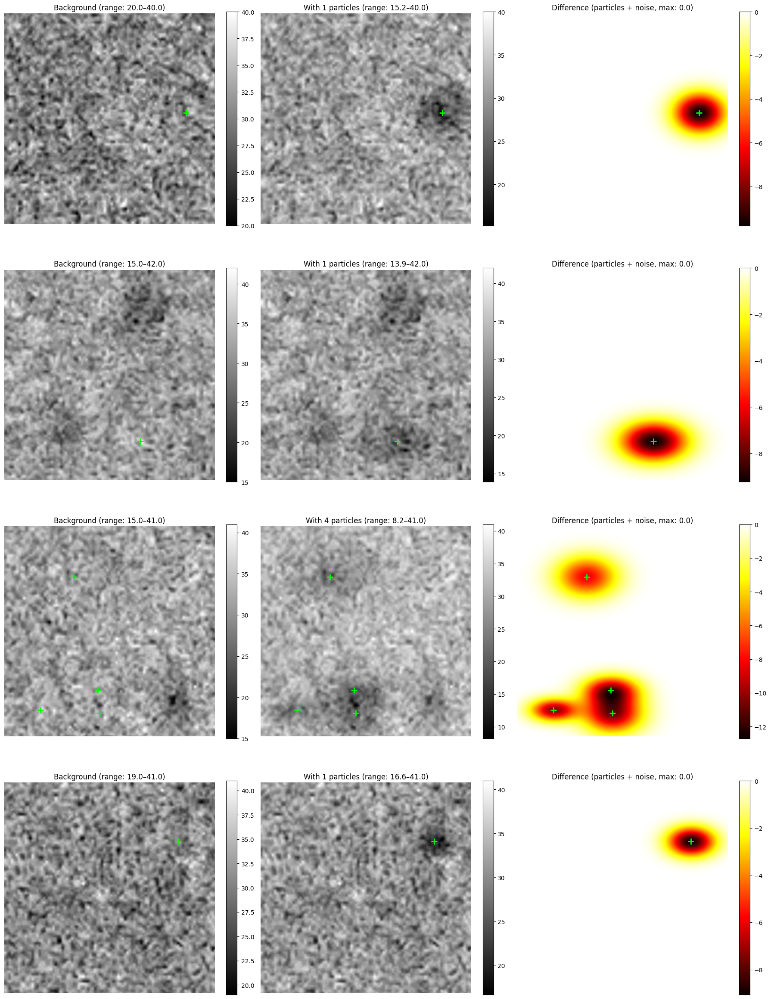

In [16]:
class GaussianDataset(Dataset):
    def __init__(self, num_batches, bg_tiles, img_size=(512, 512), transform=None):
        self.transform = transform
        self.num_batches = num_batches
        self.bg_tiles = bg_tiles
        self.img_size = img_size
        self.labels_channel = 3
        
        # --- DYNAMIC DENSITY CALCULATION ---
        # Goal: Keep particle-to-image coverage ratio consistent with the original version (20% coverage)
        
        # 1. Reference (Original Setup)
        # 50 particles (radius ~3px) in 84x84
        ref_coverage_ratio = 0.20 
        
        # 2. New Setup (Current Config)
        new_window_area = self.img_size[0] * self.img_size[1]
        
        # Using the Mean Sigmas you provided earlier
        new_sigma_x = 47.67
        new_sigma_y = 30.71
        
        
        self.num_gaus_low = 0
        self.num_gaus_high = 6
        
        # print(f"Density Calculation for {img_size}:")
        # print(f"  - Particle Dimensions: ~{int(new_sigma_x*4)}x{int(new_sigma_y*4)} pixels")
        # print(f"  - Max Particles set to: {self.num_gaus_high}")

    def __len__(self):
        return self.num_batches

    def __getitem__(self, idx):
        # We call the generate function we defined in the previous cell
        image, labels, bg_image = generate_simulation_image(
            img_size=self.img_size, 
            bg_tiles=self.bg_tiles, 
            num_gaus_low=self.num_gaus_low, 
            num_gaus_high=self.num_gaus_high,
            labels_channel=self.labels_channel
        )
        
        # Standardize / Normalize
        img_std = np.std(image)
        if img_std == 0: img_std = 1
        image = (image - np.mean(image)) / img_std
        
        # Convert to Tensor
        image = torch.from_numpy(image).float().unsqueeze(0) # (1, H, W)
        labels = torch.from_numpy(labels).float()            # (3, H, W)
        bg_image = torch.from_numpy(bg_image).float().unsqueeze(0)
        
        # Apply transforms if they exist
        if self.transform:
            image = self.transform(image)
            
        return image, labels, bg_image

# Asynchronous data loading function for batches
def async_load_batch(data_loader):
    """Load batches asynchronously using a thread pool."""
    with ThreadPoolExecutor(max_workers=8) as executor:
        futures = [executor.submit(load_batch, batch) for batch in data_loader]
        for future in futures:
            yield future.result()

def load_batch(batch):
    """Simulate batch loading (you can customize this to fit your process)."""
    time.sleep(0.1)  # Simulate a delay (remove or adjust depending on your loading time)
    return batch

# Sanity Check: Visualizing asynchronously generated data
def sanity_check(images):
    plt.figure(figsize=(8, 8))
    # Loop over generated data for visualization and checking
    for i in range(images.shape[0]):
        if i < 4 :
            plt.subplot(2, 2, i + 1)
            plt.imshow(images[i].squeeze(), cmap='gray')
            plt.colorbar()
            plt.title(f"Generated Image {i+1}")
            plt.axis('off')
    plt.tight_layout()
    plt.show()

if __name__ == '__main__':
    # Generate a few images and show background vs background+particles side by side
    print("Visual comparison: Background vs Background+Particles")
    
    num_examples = 4
    fig, axes = plt.subplots(num_examples, 3, figsize=(18, 6 * num_examples))
    
    for i in range(num_examples):
        image, labels, bg_image = generate_simulation_image(
            img_size=window_size,
            bg_tiles=bg_tiles,
            num_gaus_low=0,
            num_gaus_high=6,
            labels_channel=3
        )
        
        diff = image - bg_image  # isolates particles + noise
        
        # A. Background only
        axes[i, 0].imshow(bg_image, cmap='gray')
        axes[i, 0].set_title(f'Background (range: {bg_image.min():.1f}–{bg_image.max():.1f})')
        fig.colorbar(axes[i, 0].images[0], ax=axes[i, 0], fraction=0.046)
        
        # B. Background + particles
        axes[i, 1].imshow(image, cmap='gray')
        num_particles = int(labels[2].sum())
        axes[i, 1].set_title(f'With {num_particles} particles (range: {image.min():.1f}–{image.max():.1f})')
        fig.colorbar(axes[i, 1].images[0], ax=axes[i, 1], fraction=0.046)
        
        # C. Difference (particles + noise only)
        im = axes[i, 2].imshow(diff, cmap='hot')
        axes[i, 2].set_title(f'Difference (particles + noise, max: {diff.max():.1f})')
        fig.colorbar(im, ax=axes[i, 2], fraction=0.046)
        
        # Mark true centers on all panels
        ys, xs = np.where(labels[2] > 0)
        for ax in axes[i]:
            ax.scatter(xs, ys, color='lime', marker='+', s=100, linewidths=2)
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

## Construct single frame DECODE model

In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions

class conv_block(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.1, norm_groups=6, dilation=1):
        super(conv_block, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
                      kernel_size=3, stride=1, padding=dilation, dilation=dilation, bias=True),
            nn.GroupNorm(num_groups=norm_groups, num_channels=out_channels),
            nn.ELU(),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels,
                      kernel_size=3, stride=1, padding=dilation, dilation=dilation, bias=True),
            nn.GroupNorm(num_groups=norm_groups, num_channels=out_channels),
            nn.ELU(),
        )

    def forward(self, x):
        return self.conv(x)

class up_conv(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.1, norm_groups=6):
        super(up_conv, self).__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
                      kernel_size=3, stride=1, padding='same', bias=True),
        )

    def forward(self, x):
        return self.up(x)

class multi_head(nn.Module):
    def __init__(self, in_channels, out_channels, dropout=0.1, norm_groups=6):
        super(multi_head, self).__init__()
        self.multi_head = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=in_channels,
                      kernel_size=3, stride=1, padding='same', bias=True),
            nn.GroupNorm(num_groups=norm_groups, num_channels=in_channels),
            nn.ELU(),
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels,
                      kernel_size=1, stride=1, padding='same', bias=True)
        )

    def forward(self, x):
        return self.multi_head(x)


class GaussianMixtureModel(nn.Module):
    def __init__(self, num_channels) -> None:
        super(GaussianMixtureModel, self).__init__()
        self.out_channels_heads = (1, 3, 3, 1)  # p, mu, sigma, bg
        self.num_channels = num_channels

        # =====================================================================
        # ENCODER — now 3 levels (36 → 72 → 144) + dilated bottleneck (288)
        # Resolution: 512 → 256 → 128 → 64 (bottleneck)
        # =====================================================================
        self.Conv1 = conv_block(in_channels=num_channels, out_channels=36, norm_groups=6)
        self.Maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.Conv2 = conv_block(in_channels=36, out_channels=72, norm_groups=6)
        self.Maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.Conv3 = conv_block(in_channels=72, out_channels=144, norm_groups=6)
        self.Maxpool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Bottleneck at 64×64 — dilated convolutions for receptive field expansion
        # Each pixel here covers 8×8 in the original image.
        # dilation=4 → RF contribution ~33px original, dilation=8 → ~65px original
        # Combined with encoder path: total RF easily covers a 150px particle.
        self.Conv4 = nn.Sequential(
            conv_block(144, 288, norm_groups=6, dilation=4),
            conv_block(288, 288, norm_groups=6, dilation=8),
        )

        # =====================================================================
        # DECODER — 3 upsampling levels back to full resolution
        # =====================================================================
        self.Up3 = up_conv(in_channels=288, out_channels=144, norm_groups=6)
        self.Up_conv3 = conv_block(in_channels=288, out_channels=144, norm_groups=6)  # 144 skip + 144 up = 288

        self.Up2 = up_conv(in_channels=144, out_channels=72, norm_groups=6)
        self.Up_conv2 = conv_block(in_channels=144, out_channels=72, norm_groups=6)   # 72 skip + 72 up = 144

        self.Up1 = up_conv(in_channels=72, out_channels=36, norm_groups=6)
        self.Up_conv1 = conv_block(in_channels=72, out_channels=36, norm_groups=6)    # 36 skip + 36 up = 72

        self.dropout = nn.Dropout2d(p=0.3)
        self.sigma_eps = 0.001

        self.mt_heads = torch.nn.ModuleList(
            [multi_head(in_channels=36, out_channels=ch_out, norm_groups=6)
             for ch_out in self.out_channels_heads]
        )

        self.initialize_weights()

        # =================================================================
        # FIX: Initialize p-head bias to -6 so sigmoid(-6) ≈ 0.0025
        # Without this, sigmoid(0) = 0.5 → p.sum() ≈ 131k at init.
        # With this,   sigmoid(-6) ≈ 0.0025 → p.sum() ≈ 655 at init.
        # This is AFTER initialize_weights so it won't be overwritten.
        # =================================================================
        nn.init.constant_(self.mt_heads[0].multi_head[-1].bias, -6.0)
        nn.init.zeros_(self.mt_heads[0].multi_head[-1].weight)

    def initialize_weights(self):
        for m in self.modules():
            if isinstance(m, (nn.Conv2d, nn.Linear)):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.GroupNorm):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x, training=False):
        # --- Encoder ---
        x1 = self.Conv1(x)                     # (B, 36,  512, 512)
        x2 = self.Conv2(self.Maxpool1(x1))     # (B, 72,  256, 256)
        x3 = self.Conv3(self.Maxpool2(x2))     # (B, 144, 128, 128)
        x4 = self.Conv4(self.Maxpool3(x3))     # (B, 288,  64,  64)

        # --- Decoder ---
        d3 = self.Up3(x4)                      # (B, 144, 128, 128)
        d3 = torch.cat((x3, d3), dim=1)        # (B, 288, 128, 128)
        d3 = self.Up_conv3(d3)                  # (B, 144, 128, 128)

        d2 = self.Up2(d3)                       # (B, 72, 256, 256)
        d2 = torch.cat((x2, d2), dim=1)        # (B, 144, 256, 256)
        d2 = self.Up_conv2(d2)                  # (B, 72, 256, 256)

        d1 = self.Up1(d2)                       # (B, 36, 512, 512)
        d1 = torch.cat((x1, d1), dim=1)        # (B, 72, 512, 512)
        d1 = self.Up_conv1(d1)                  # (B, 36, 512, 512)

        d = [mt_head.forward(d1) for mt_head in self.mt_heads]

        # --- Head Activations ---
        p = torch.sigmoid(torch.clamp(d[0], min=-20.0, max=20.0))

        pxyn_mean = d[1]
        pxyn_mean[:, [0, 1], ...] = torch.tanh(pxyn_mean[:, [0, 1], ...])
        pxyn_mean[:, [2], ...]    = torch.sigmoid(pxyn_mean[:, [2], ...]) * 100

        pxy_std = torch.sigmoid(d[2]) * 50 + self.sigma_eps
        bg = d[3]

        return p, pxyn_mean, pxy_std, bg


# =========================================================================
# HELPER: get_ground_truth_targets  (unchanged)
# =========================================================================
def get_ground_truth_targets(labels, xy_coord):
    batch_size = labels.shape[0]
    targets_list = []
    for b in range(batch_size):
        presence_map = labels[b, 2, ...] > 0
        indices = torch.nonzero(presence_map, as_tuple=False)
        if len(indices) == 0:
            targets_list.append(None)
            continue
        y_idx, x_idx = indices[:, 0], indices[:, 1]
        vals = labels[b, :, y_idx, x_idx].t()
        grid_x = xy_coord[0, 0, y_idx, x_idx]
        grid_y = xy_coord[0, 1, y_idx, x_idx]
        vals[:, 0] = vals[:, 0] + grid_x
        vals[:, 1] = vals[:, 1] + grid_y
        targets_list.append(vals)
    return targets_list


# =========================================================================
# LOSS — GMMLoss with all fixes
# =========================================================================
class GMMLoss(nn.Module):
    def __init__(self, img_size, device) -> None:
        super(GMMLoss, self).__init__()
        self._bg_loss = nn.MSELoss()
        x_coord = torch.linspace(start=0.0, end=img_size, steps=img_size + 1)[:-1].unsqueeze(0) + 0.5
        y_coord = torch.linspace(start=0.0, end=img_size, steps=img_size + 1)[:-1].unsqueeze(1) + 0.5
        self._xy_coord = torch.cat((
            x_coord.expand(1, 1, img_size, img_size),
            y_coord.expand(1, 1, img_size, img_size)
        ), 1).to(device=device)

    def forward(self, p, pxyn_mean, pxy_std, bg, labels, labels_bg):
        batch_size = p.shape[0]

        # ==============================================================
        # 1. COUNT LOSS — Direct MSE on sum(p) vs ground-truth count
        #    Replaces the Gaussian-approximation version which was too
        #    indirect and gave weak gradients when p_sum >> gt_count.
        # ==============================================================
        p_sum = p.sum(dim=(-2, -1)).squeeze(-1)  # (B,)
        labels_intensity = labels[:, 2, ...] > 0
        gt_count = labels_intensity.sum(dim=(-2, -1)).float()  # (B,)
        count_loss = F.mse_loss(p_sum, gt_count)

        # ==============================================================
        # 2. BCE LOSS — Per-pixel supervision on probability map
        #    Dilate the single-pixel GT centers to a ~21px radius disk
        #    so the network gets a broader spatial signal.
        #    With p initialized near 0 everywhere (bias=-6), the BCE
        #    gradient is naturally ~2400× stronger at positive pixels.
        # ==============================================================
        gt_presence = (labels[:, 2:3, ...] > 0).float()        # (B,1,H,W)
        gt_dilated = F.max_pool2d(gt_presence, kernel_size=5, stride=1, padding=2)
        bce_loss = F.binary_cross_entropy(p, gt_dilated, reduction='mean')

        # ==============================================================
        # 3. BACKGROUND LOSS — unchanged
        # ==============================================================
        bg_loss = self._bg_loss(bg, labels_bg)

        # ==============================================================
        # 4. GMM LOSS — unchanged logic
        # ==============================================================
        gt_targets_list = get_ground_truth_targets(labels, self._xy_coord)
        total_gmm_log_prob = 0
        valid_batches = 0

        p_flat = p.view(batch_size, -1)
        p_normed = p_flat / (p_flat.sum(dim=1, keepdim=True) + 1e-6)

        pxyn_mean_abs = pxyn_mean.clone()
        pxyn_mean_abs[:, 0, ...] = pxyn_mean_abs[:, 0, ...] + self._xy_coord[:, 0, ...]
        pxyn_mean_abs[:, 1, ...] = pxyn_mean_abs[:, 1, ...] + self._xy_coord[:, 1, ...]
        mu_flat  = pxyn_mean_abs.view(batch_size, 3, -1).permute(0, 2, 1)
        std_flat = pxy_std.view(batch_size, 3, -1).permute(0, 2, 1)

        for b in range(batch_size):
            targets = gt_targets_list[b]
            if targets is None or targets.shape[0] == 0:
                continue
            valid_batches += 1
            mix  = torch.distributions.Categorical(probs=p_normed[b] + 1e-8)
            comp = torch.distributions.Independent(
                       torch.distributions.Normal(mu_flat[b], std_flat[b] + 1e-6), 1)
            gmm  = torch.distributions.mixture_same_family.MixtureSameFamily(mix, comp)
            log_probs = gmm.log_prob(targets)
            total_gmm_log_prob += log_probs.sum()

        gmm_loss = -(total_gmm_log_prob / valid_batches) if valid_batches > 0 \
                   else torch.tensor(0.0, device=p.device)

        # Return all 4 loss components
        return count_loss, gmm_loss, bg_loss, bce_loss

## Construct train function

In [18]:
def visualize_result(epoch, GT, images, labels_bg, p, pxy_mean, pxy_std,
                     true_counts_list, predicted_counts_p_list,
                     save_image=False, output_dir=None, eval=False):
    fig_key = ['IMG',
               'LABEL_GT',
               'P_COUNT',
               'X_MEAN',
               'Y_MEAN',
               'INTENSI',
               'X_VAR',
               'Y_VAR',
               'I_VAR',
               ]

    fig_dict = {'IMG'      : images[-1].detach().cpu(),
                'LABEL_GT' : GT[-1, ...].detach().cpu(),
                'P_COUNT'  : p[-1].detach().cpu().numpy(),
                'X_MEAN'   : pxy_mean[-1, 0, ...].detach().cpu().numpy(),
                'Y_MEAN'   : pxy_mean[-1, 1, ...].detach().cpu().numpy(),
                'INTENSI'  : pxy_mean[-1, 2, ...].detach().cpu().numpy(),
                'X_VAR'    : pxy_std[-1, 0, ...].detach().cpu().numpy(),
                'Y_VAR'    : pxy_std[-1, 1, ...].detach().cpu().numpy(),
                'I_VAR'    : pxy_std[-1, 2, ...].detach().cpu().numpy(),
                }

    if not epoch % 10:
        px = 1 / plt.rcParams['figure.dpi']
        fig, axs = plt.subplots(2, 5, figsize=(2500 * px, 1000 * px))

        for i, ax in enumerate(axs.flatten()):
            if i == 9:
                if len(true_counts_list) > 0:
                    max_count = max(max(true_counts_list), max(predicted_counts_p_list)) + 1
                    true_line = [[0, max_count]] * 2
                    ax.plot(*true_line, 'r-', alpha=0.5)
                    ax.scatter(true_counts_list, predicted_counts_p_list, s=10, c="blue", alpha=0.5)
                ax.set_title("Counting Accuracy")
                ax.set_xlabel("True Counts")
                ax.set_ylabel("Predicted Counts")
                continue

            IMG = np.squeeze(fig_dict[fig_key[i]])
            a = ax.imshow(IMG, cmap='viridis' if 'VAR' in fig_key[i] else 'gray')
            ax.set_title(fig_key[i])
            fig.colorbar(a, ax=ax)

        if save_image and output_dir:
            mode = 'eval' if eval else 'train'
            save_path = f'{output_dir}/{epoch}_epoch_{mode}.png'
            plt.savefig(save_path, dpi=300)

        if not epoch % 50:
            plt.show()
        else:
            plt.close()


def evaluate(model, loss_fun, data_loader, device, epoch, output_dir):
    model.eval()
    loss = 0
    true_counts_list, predicted_counts_p_list = [], []

    with torch.no_grad():
        for images, labels, labels_bg in data_loader:
            images   = images.to(device=device)
            labels   = labels.to(device=device)
            labels_bg = labels_bg.to(device=device)

            p, pxy_mean, pxy_std, bg = model(images, training=False)

            # ---- Updated: 4 loss components ----
            count_loss, gmm_loss, bg_loss, bce_loss = loss_fun(
                p, pxy_mean, pxy_std, bg, labels, labels_bg)
            loss += (count_loss + gmm_loss + bg_loss + 10.0 * bce_loss).mean()

            for GT_single, p_single in zip(labels[:, -1, ...] > 0, p):
                true_counts = torch.sum(GT_single).item()
                predicted_counts_p = torch.sum(p_single).item()
                true_counts_list.append(true_counts)
                predicted_counts_p_list.append(predicted_counts_p)

        GT_batch = labels[:, -1, ...] > 0
        visualize_result(epoch, GT_batch, images, labels_bg, p, pxy_mean, pxy_std,
                         true_counts_list, predicted_counts_p_list,
                         save_image=True, output_dir=output_dir, eval=True)

    return loss


def train(model, num_epoch, start_epoch, optimizer, scheduler, loss_fun,
          device, writer, output_dir, bg_tiles, window_size):
    model.to(device=device)

    train_loss = torch.zeros(num_epoch)
    test_loss  = torch.zeros(num_epoch)

    best_loss = np.inf

    # --- BATCH SIZE ---
    # Reduced from 16 → 8 to accommodate the deeper 3-level encoder.
    # If your GPU has headroom, try 10 or 12.
    actual_dataloader_batch_size = 8
    accumulation_steps = 4  # effective batch = 8 * 2 = 32

    num_samples_train = 600
    num_samples_eval  = 200

    print(f"Training Config: Image {window_size}, "
          f"Effective Batch {actual_dataloader_batch_size * accumulation_steps}")

    pbar = tqdm(range(start_epoch, num_epoch), total=num_epoch, initial=start_epoch)

    for epoch in pbar:
        epoch_start_time = time.time()
        model.train()

        batch_loss_list = []
        count_loss_list, gmm_loss_list, bg_loss_list, bce_loss_list = [], [], [], []
        true_counts_list, predicted_counts_p_list = [], []

        train_dataset = GaussianDataset(num_batches=num_samples_train,
                                         bg_tiles=bg_tiles, img_size=window_size)
        train_dataloader = DataLoader(train_dataset,
                                       batch_size=actual_dataloader_batch_size,
                                       shuffle=True, num_workers=0, pin_memory=True)

        optimizer.zero_grad()

        for i, (images, labels, labels_bg) in enumerate(train_dataloader):
            images    = images.to(device=device)
            labels    = labels.to(device=device)
            labels_bg = labels_bg.to(device=device)

            p, pxy_mean, pxy_std, bg = model(images, training=True)

            # ---- Updated: 4 loss components ----
            count_loss, gmm_loss, bg_loss, bce_loss = loss_fun(
                p, pxy_mean, pxy_std, bg, labels, labels_bg)

            # ==============================================================
            # LOSS WEIGHTING
            #   count_loss (MSE):  dominant early (~6000), shrinks fast. ×1.0
            #   gmm_loss (NLL):    spatial precision signal.             ×1.0
            #   bg_loss (MSE):     background reconstruction.            ×1.0
            #   bce_loss (BCE):    per-pixel presence supervision.       ×10.0
            #                      (raw BCE is ~0.05 due to imbalance,
            #                       10× brings it to ~0.5, meaningful
            #                       but not dominant.)
            #
            # Adjust these if one loss component dominates TensorBoard.
            # ==============================================================
            loss = (1.0 * count_loss) + (1.0 * gmm_loss) + (1.0 * bg_loss) + (0.5 * bce_loss)

            loss_item = loss.item()

            loss = loss / accumulation_steps
            loss.backward()

            if (i + 1) % accumulation_steps == 0:
                optimizer.step()
                optimizer.zero_grad()

            batch_loss_list.append(loss_item)
            count_loss_list.append(count_loss.item())
            gmm_loss_list.append(gmm_loss.item())
            bg_loss_list.append(bg_loss.item())
            bce_loss_list.append(bce_loss.item())

            for GT_single, p_val in zip(labels[:, -1, ...] > 0, p):
                true_counts_list.append(torch.sum(GT_single).item())
                predicted_counts_p_list.append(torch.sum(p_val).item())

        if (len(train_dataloader) % accumulation_steps != 0):
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.5)
            optimizer.step()
            optimizer.zero_grad()

        # Visualize
        GT_batch = labels[:, -1, ...] > 0
        visualize_result(epoch, GT_batch, images, labels_bg, p, pxy_mean, pxy_std,
                         true_counts_list, predicted_counts_p_list,
                         save_image=True, output_dir=output_dir, eval=False)

        scheduler.step()
        lr = scheduler.get_last_lr()[0]
        train_loss[epoch] = np.mean(batch_loss_list)

        # --- EVALUATION ---
        eval_dataset = GaussianDataset(num_batches=num_samples_eval,
                                        bg_tiles=bg_tiles, img_size=window_size)
        eval_dataloader = DataLoader(eval_dataset,
                                      batch_size=actual_dataloader_batch_size,
                                      shuffle=True, num_workers=0, pin_memory=True)

        loss_test = evaluate(model=model, loss_fun=loss_fun,
                              data_loader=eval_dataloader, device=device,
                              epoch=epoch, output_dir=output_dir)
        test_loss[epoch] = loss_test.item()

        if writer:
            writer.add_scalar('Loss/Count',      np.mean(count_loss_list), epoch + 1)
            writer.add_scalar('Loss/GMM',        np.mean(gmm_loss_list),   epoch + 1)
            writer.add_scalar('Loss/Background', np.mean(bg_loss_list),    epoch + 1)
            writer.add_scalar('Loss/BCE',        np.mean(bce_loss_list),   epoch + 1)  # NEW
            writer.add_scalar('Loss/Train',      train_loss[epoch],        epoch + 1)
            writer.add_scalar('Loss/Test',       test_loss[epoch],         epoch + 1)
            writer.add_scalar('LR',              lr,                       epoch + 1)

        pbar.set_description(
            f"Epoch {epoch+1} | Loss: {np.mean(batch_loss_list):.4f} "
            f"| Cnt: {np.mean(count_loss_list):.1f} "
            f"| GMM: {np.mean(gmm_loss_list):.1f} "
            f"| BCE: {np.mean(bce_loss_list):.4f} "
            f"| Test: {loss_test.item():.4f}")

        # --- SAVING LOGIC ---
        if loss_test < best_loss:
            best_loss = loss_test
            torch.save(model.state_dict(), f'{output_dir}/LOCA_PRAM_BEST.pth')

        if (epoch + 1) % 20 == 0:
            chk_name = f'{output_dir}/LOCA_PRAM_checkpoint_epoch_{epoch+1}.pth'
            torch.save(model.state_dict(), chk_name)

    return train_loss, test_loss, model

In [19]:
import time
import torch # Assuming torch is needed inside generate_simulation_image
import numpy as np # Assuming numpy is needed inside generate_simulation_image
if __name__ == '__main__':
    # Test single image generation time
    num_test_images = 10 # Generate 100 images to get an average
    single_image_gen_times = []
    
    for _ in range(num_test_images):
        start_gen_time = time.time()
        # Call your generate_simulation_image function as it would be called by __getitem__
        # Use actual img_size and bg_tiles
        generated_image, _, _ = generate_simulation_image(
            img_size=window_size, # Use your actual window_size
            bg_tiles=bg_tiles,     # Use your actual bg_tiles
            num_gaus_low=0,
            num_gaus_high=6,
            labels_channel=3
        )
        end_gen_time = time.time()
        single_image_gen_times.append(end_gen_time - start_gen_time)
    
    average_gen_time = np.mean(single_image_gen_times)
    print(f"Average time to generate a single image: {average_gen_time:.4f} seconds")
    print(f"Estimated time to fill DataLoader queue (approx 2-3x num_workers * batch_size images):")
    # Assuming a queue size that needs about 2-3 times the number of workers times batch_size images
    # 2.5 * 15 workers * 10 images/batch * average_gen_time = total queue fill time
    estimated_queue_fill_time = (2.5 * 15 * 10 * average_gen_time) # Rough estimate for 15 workers, batch 10
    print(f"  Roughly {estimated_queue_fill_time:.2f} seconds based on 15 workers and batch size 10.")

Average time to generate a single image: 0.0081 seconds
Estimated time to fill DataLoader queue (approx 2-3x num_workers * batch_size images):
  Roughly 3.04 seconds based on 15 workers and batch size 10.


## Main

 Current device is: cuda:0
Training from scratch with new architecture.
✅ Initial p.sum() = 648.2  (target range: 0–7)
Starting training...
Training Config: Image (512, 512), Effective Batch 32


  0%|                                                                                                                   | 0/2500 [00:00<?, ?it/s]

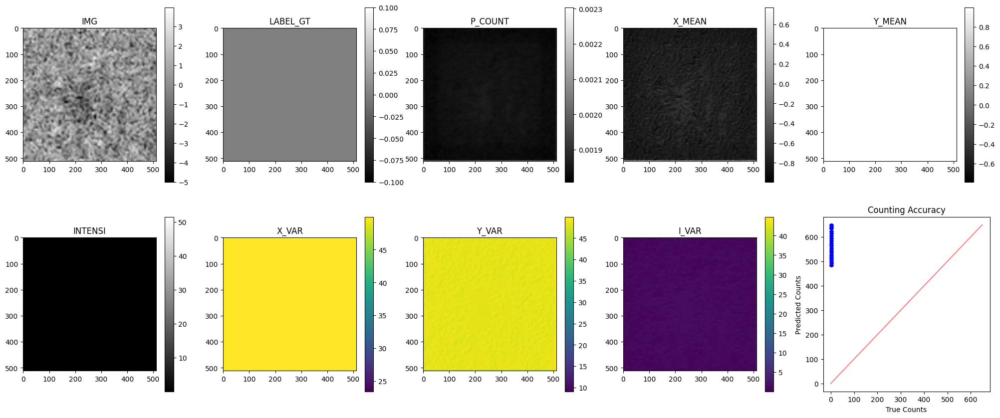

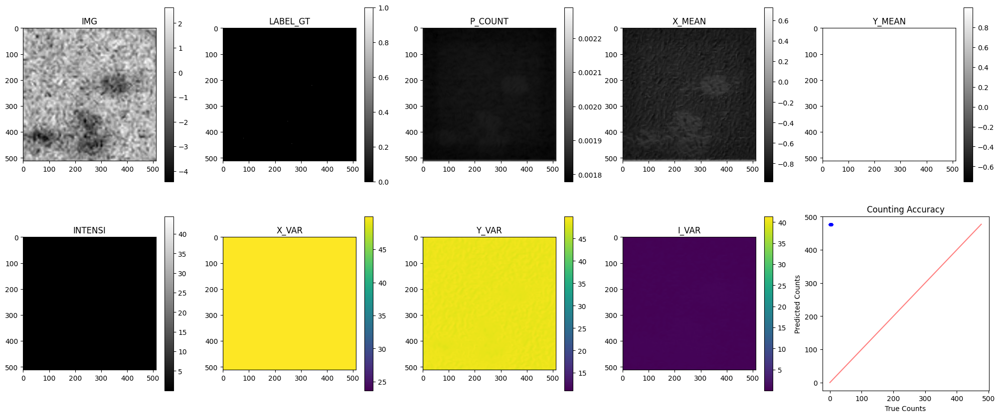

Epoch 5 | Loss: 48056.1092 | Cnt: 48004.5 | GMM: 43.8 | BCE: 0.0026 | Test: 1024013.1250:   0%|              | 5/2500 [03:46<31:20:56, 45.23s/it]


KeyboardInterrupt: 

In [21]:
from torch.distributions import Distribution
import datetime
import gc
import os

if __name__ == '__main__':
    Distribution.set_default_validate_args(False)

    # --- HYPERPARAMETERS ---
    learning_rate = 6e-4
    momentum      = 0.9
    weight_decay  = 0.001
    gamma         = 0.1

    current_time = datetime.datetime.now().strftime('%Y.%m.%d_%H.%M.%S')
    output_dir   = 'runs/' + current_time + '/'

    batch_size = 32
    seed       = 2
    max_epoch  = 2500#1750

    in_channel = 1
    milestones = [1500, 2000, 2250]#[1000, 1250, 1500]
    linear_lr_scheduler_max = 50

    window_size = (512, 512)

    torch.manual_seed(seed)

    gc.collect()
    torch.cuda.empty_cache()

    model  = GaussianMixtureModel(num_channels=in_channel)
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(f" Current device is: {device}")

    loss_fun = GMMLoss(img_size=window_size[0], device=device)
    model.to(device)
    writer = SummaryWriter(output_dir, flush_secs=10)

    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate,
                                   weight_decay=weight_decay)

    def lr_lambda(epoch):
        if epoch < 1000:
            return 1.0       # 6e-4
        elif epoch < 1500:
            return 0.316     # ~1.9e-4 (intermediate)
        elif epoch < 2000:
            return 0.1       # 6e-5
        elif epoch < 2250:
            return 0.01      # 6e-6
        else:
            return 0.001     # 6e-7
    
    scheduler1 = torch.optim.lr_scheduler.LinearLR(optimizer, start_factor=1e-9, total_iters=50)
    scheduler2 = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)
    scheduler = torch.optim.lr_scheduler.ChainedScheduler([scheduler1, scheduler2])

    # ==================================================================
    # IMPORTANT: Train from scratch with the new architecture + loss.
    # The old checkpoint was trained with 2-level encoder and weak count
    # loss, so loading it would fight the new bias init and architecture.
    # Uncomment the block below once you have a new checkpoint to resume.
    # ==================================================================
    checkpoint_path = None #"LOCA_PRAM_checkpoint_epoch_1000.pth"  # Set to None to train from scratch
    # checkpoint_path = "v3_epoch_252.pth"  # ← old checkpoint, don't use

    start_epoch = 0

    if checkpoint_path and os.path.isfile(checkpoint_path):
        print(f"Loading checkpoint from: {checkpoint_path}")
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint)

        try:
            filename = os.path.basename(checkpoint_path)
            raw_epoch_part = filename.split('_')[-1]
            epoch_str = raw_epoch_part.split('.')[0]
            start_epoch = int(epoch_str) + 1
            print(f"Resuming from epoch: {start_epoch}")
        except (IndexError, ValueError):
            print("Could not parse epoch number. Starting from 0.")
            start_epoch = 0
    else:
        print("Training from scratch with new architecture.")

    if start_epoch > 0:
        print(f"⏩ Fast-forwarding scheduler to step {start_epoch}...")
        for _ in range(start_epoch):
            scheduler.step()
        current_lr = optimizer.param_groups[0]['lr']
        print(f"✅ Current Learning Rate: {current_lr:.2e}")

    # Quick sanity check: verify p.sum() at initialization
    model.eval()
    with torch.no_grad():
        dummy = torch.randn(1, 1, 512, 512).to(device)
        p_init, _, _, _ = model(dummy)
        print(f"✅ Initial p.sum() = {p_init.sum().item():.1f}  (target range: 0–7)")
    model.train()

    print("Starting training...")

    train_loss, test_loss, model = train(
        model=model,
        num_epoch=max_epoch,
        start_epoch=start_epoch,
        optimizer=optimizer,
        scheduler=scheduler,
        loss_fun=loss_fun,
        device=device,
        writer=writer,
        output_dir=output_dir,
        bg_tiles=bg_tiles,
        window_size=window_size
    )

    plt.plot(train_loss, 's-', label='Train')
    plt.plot(test_loss, 'o-', label='Test')0
    plt.xlabel('Epochs')
    plt.ylabel('Loss (MSE)')
    plt.legend()
    plt.title('Model loss (final test loss: %.2f)' % test_loss[-1])
    plt.show()

## Clear cache

In [33]:
import gc
import torch
if __name__ == '__main__':
    gc.collect()
    torch.cuda.empty_cache()

## Test the trained model

Loading model from: C:\Users\hankeun2\OneDrive - University of Illinois - Urbana\04. LOCA-PRAM\brian_test\final_v2.pth
Device: cuda:0
Background: (6985, 8192), range: [58.0, 153.0]
Generating test image with particles on real background...
  Image: 8192 x 6985
  Tiles: 13 x 16 = 208
  True particles: 808
Running inference...

  RESULTS (threshold=0.002)
  True: 808  |  Detected: 799
  TP: 776  |  FP: 23  |  FN: 32
  Precision: 0.971
  Recall:    0.960
  F1 Score:  0.966
  Mean localization error: 4.72 px
  Median localization error: 3.48 px



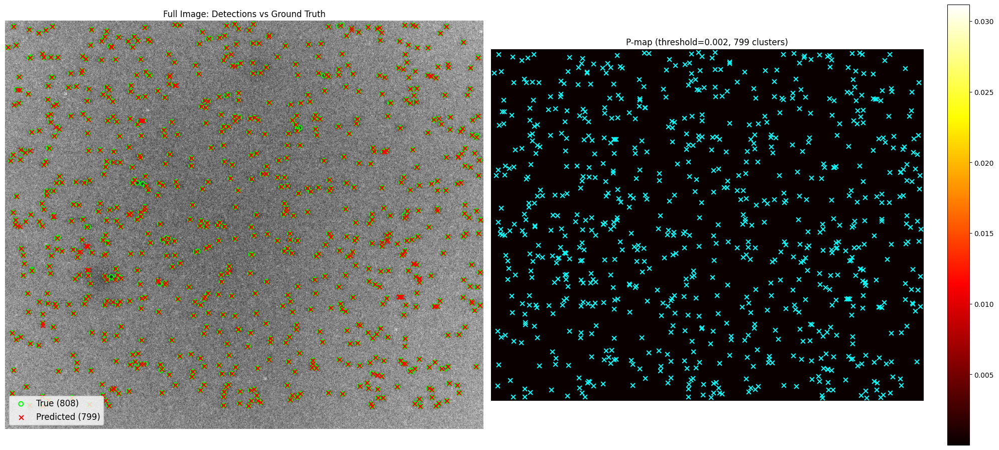

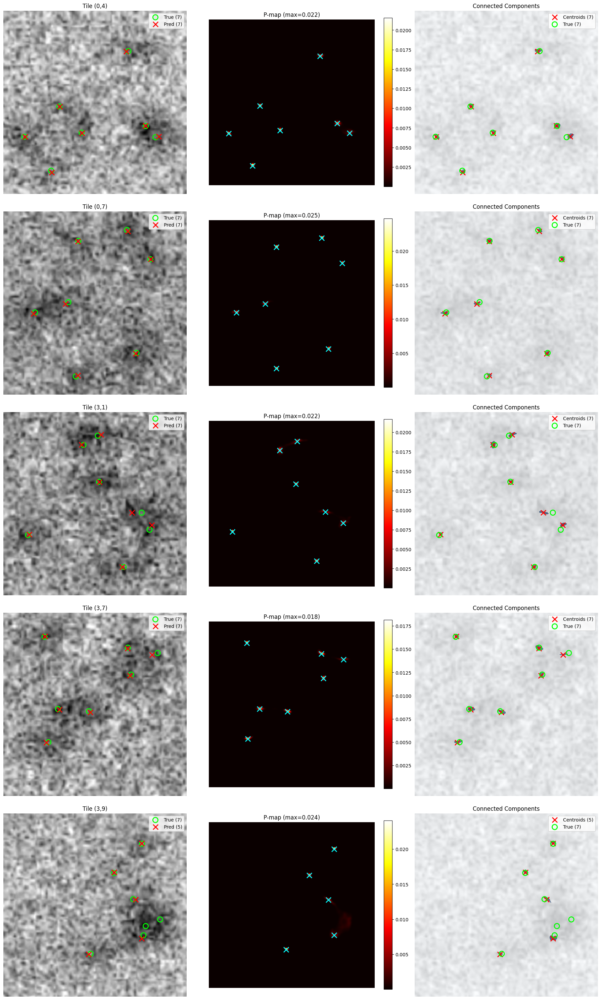

Running threshold sweep...
  thr=0.0: det= 792, TP= 763, FP=  29, FN=  45, P=0.963, R=0.944, F1=0.954
  thr=0.0: det= 799, TP= 776, FP=  23, FN=  32, P=0.971, R=0.960, F1=0.966
  thr=0.0: det= 768, TP= 759, FP=   9, FN=  49, P=0.988, R=0.939, F1=0.963
  thr=0.0: det= 730, TP= 724, FP=   6, FN=  84, P=0.992, R=0.896, F1=0.941
  thr=0.0: det= 701, TP= 697, FP=   4, FN= 111, P=0.994, R=0.863, F1=0.924
  thr=0.0: det= 669, TP= 667, FP=   2, FN= 141, P=0.997, R=0.825, F1=0.903
  thr=0.0: det= 645, TP= 642, FP=   3, FN= 166, P=0.995, R=0.795, F1=0.884
  thr=0.0: det= 614, TP= 614, FP=   0, FN= 194, P=1.000, R=0.760, F1=0.864


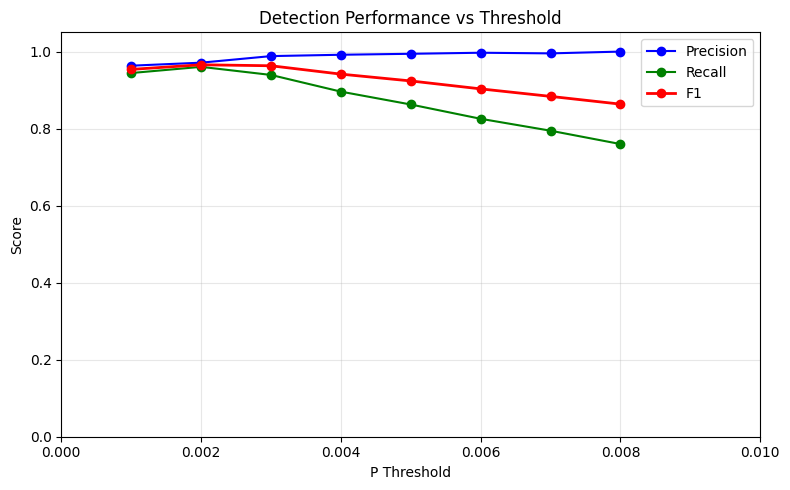


  Best F1=0.966 at threshold=0.0


In [42]:
###############################################################################
# TEST CELL v3 — Matches current training setup
#
# - Real synthetic background (Picture3_orig_synthetic_v3.png)
# - Particles are DARKER (subtracted from background)
# - Amplitude: 16 ± 1.5
# - 1–12 particles per tile
# - No additional noise (background already has real texture)
# - Connected component clustering for detection
###############################################################################

import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from scipy import ndimage as ndi
import os

Image.MAX_IMAGE_PIXELS = None


def add_particles_to_background(bg_image, tile_size=(512, 512),
                                 num_gaus_low=0, num_gaus_high=6):
    """
    Add dark Gaussian particles to the real background image.
    Matches training: particles subtracted, no extra noise.
    """
    full_image = bg_image.copy().astype(np.float32)
    h, w = full_image.shape
    all_true_positions = []
    all_true_amplitudes = []

    n_tiles_y = h // tile_size[0]
    n_tiles_x = w // tile_size[1]

    for ty in range(n_tiles_y):
        for tx in range(n_tiles_x):
            y_off = ty * tile_size[0]
            x_off = tx * tile_size[1]

            num_particles = np.random.randint(num_gaus_low, num_gaus_high)

            for _ in range(num_particles):
                amplitude = max(1.0, np.random.normal(loc=16.0, scale=1.5))
                margin = 50
                x_c = np.random.uniform(margin, tile_size[1] - margin)
                y_c = np.random.uniform(margin, tile_size[0] - margin)
                sigma_x = max(10.0, np.random.normal(loc=42.988, scale=6.914))
                sigma_y = max(10.0, np.random.normal(loc=30.363, scale=4.809))

                x_vec = np.arange(tile_size[1])
                y_vec = np.arange(tile_size[0])
                g_x = np.exp(-((x_vec - x_c) ** 2) / (2 * sigma_x ** 2))
                g_y = np.exp(-((y_vec - y_c) ** 2) / (2 * sigma_y ** 2))
                particle = np.outer(g_y, g_x) * amplitude

                # SUBTRACT — particles are darker, matching training
                full_image[y_off:y_off + tile_size[0],
                           x_off:x_off + tile_size[1]] -= particle

                all_true_positions.append((x_off + x_c, y_off + y_c))
                all_true_amplitudes.append(amplitude)

    # No extra noise — background already has real texture

    full_image = np.clip(full_image, 0, 65535)
    return full_image, np.array(all_true_positions), np.array(all_true_amplitudes)


def cluster_detections(p_map, p_threshold):
    """
    Threshold p-map, group adjacent pixels via connected components,
    return p-weighted centroid per cluster.
    """
    binary = (p_map > p_threshold).astype(np.int32)
    labeled, num_features = ndi.label(binary)

    centroids_x = []
    centroids_y = []
    peak_values = []

    for i in range(1, num_features + 1):
        ys, xs = np.where(labeled == i)
        weights = p_map[ys, xs]
        cx = np.average(xs, weights=weights)
        cy = np.average(ys, weights=weights)
        centroids_x.append(cx)
        centroids_y.append(cy)
        peak_values.append(weights.max())

    return (np.array(centroids_x), np.array(centroids_y),
            np.array(peak_values), labeled, num_features)


def match_detections(true_pos, pred_x, pred_y, match_radius=30):
    """
    Match predicted detections to ground truth positions.
    Returns: (true_positives, false_positives, false_negatives, matches)
    """
    if len(true_pos) == 0:
        return 0, len(pred_x), 0, []
    if len(pred_x) == 0:
        return 0, 0, len(true_pos), []

    matched_true = set()
    matched_pred = set()
    matches = []

    # For each prediction, find closest unmatched ground truth
    for pi in range(len(pred_x)):
        dists = np.sqrt((true_pos[:, 0] - pred_x[pi]) ** 2 +
                        (true_pos[:, 1] - pred_y[pi]) ** 2)
        for ti in np.argsort(dists):
            if dists[ti] > match_radius:
                break
            if ti not in matched_true:
                matched_true.add(ti)
                matched_pred.add(pi)
                matches.append((ti, pi, dists[ti]))
                break

    tp = len(matches)
    fp = len(pred_x) - tp
    fn = len(true_pos) - tp
    return tp, fp, fn, matches


def test_on_synthetic(model, device, bg_image, window_size=(512, 512),
                      p_threshold=0.3, num_example_tiles=5):
    model.eval()

    # --- 1. Generate test image ---
    print("Generating test image with particles on real background...")
    full_image, true_positions, true_amplitudes = add_particles_to_background(
        bg_image, tile_size=window_size)

    h, w = full_image.shape
    n_tiles_y = h // window_size[0]
    n_tiles_x = w // window_size[1]
    n_tiles = n_tiles_y * n_tiles_x
    print(f"  Image: {w} x {h}")
    print(f"  Tiles: {n_tiles_y} x {n_tiles_x} = {n_tiles}")
    print(f"  True particles: {len(true_positions)}")

    # --- 2. Tile and normalize (same as training) ---
    tiles = []
    for ty in range(n_tiles_y):
        for tx in range(n_tiles_x):
            tile = full_image[ty * window_size[0]: (ty + 1) * window_size[0],
                              tx * window_size[1]: (tx + 1) * window_size[1]]
            std = np.std(tile)
            if std == 0:
                std = 1
            tile = (tile - np.mean(tile)) / std
            tiles.append(tile)

    tiles_tensor = torch.from_numpy(np.array(tiles)).float().unsqueeze(1)

    # --- 3. Inference (one tile at a time) ---
    print("Running inference...")
    p_list, pxy_mean_list = [], []
    with torch.no_grad():
        for i in range(tiles_tensor.shape[0]):
            single_tile = tiles_tensor[i:i + 1].to(device)
            p_i, pxy_mean_i, _, _ = model(single_tile, training=False)
            p_list.append(p_i.cpu())
            pxy_mean_list.append(pxy_mean_i[:, [0, 1], ...].cpu())

    p = torch.cat(p_list, dim=0)
    pxy_mean_np = torch.cat(pxy_mean_list, dim=0).numpy()

    # --- 4. Stitch p-map ---
    _, _, p_h, p_w = p.shape
    p_full = np.zeros((n_tiles_y * p_h, n_tiles_x * p_w), dtype=np.float32)

    for i in range(p.shape[0]):
        ty = i // n_tiles_x
        tx = i % n_tiles_x
        p_full[ty * p_h:(ty + 1) * p_h,
               tx * p_w:(tx + 1) * p_w] = p[i, 0, ...].cpu().numpy()

    # --- 5. Cluster and refine ---
    det_x, det_y, peak_vals, labeled, num_clusters = cluster_detections(
        p_full, p_threshold)

    # Sub-pixel refinement
    refined_x, refined_y = det_x.copy(), det_y.copy()
    for i in range(len(det_x)):
        px = int(np.clip(round(det_x[i]), 0, p_full.shape[1] - 1))
        py = int(np.clip(round(det_y[i]), 0, p_full.shape[0] - 1))
        ti_y = py // p_h
        ti_x = px // p_w
        ti = ti_y * n_tiles_x + ti_x
        ly, lx = py % p_h, px % p_w
        if ti < pxy_mean_np.shape[0]:
            refined_x[i] = px + pxy_mean_np[ti, 0, ly, lx]
            refined_y[i] = py + pxy_mean_np[ti, 1, ly, lx]

    # --- 6. Match detections to ground truth ---
    tp, fp, fn, matches = match_detections(true_positions, refined_x, refined_y)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0

    print(f"\n{'='*50}")
    print(f"  RESULTS (threshold={p_threshold})")
    print(f"{'='*50}")
    print(f"  True: {len(true_positions)}  |  Detected: {num_clusters}")
    print(f"  TP: {tp}  |  FP: {fp}  |  FN: {fn}")
    print(f"  Precision: {precision:.3f}")
    print(f"  Recall:    {recall:.3f}")
    print(f"  F1 Score:  {f1:.3f}")
    if matches:
        match_dists = [m[2] for m in matches]
        print(f"  Mean localization error: {np.mean(match_dists):.2f} px")
        print(f"  Median localization error: {np.median(match_dists):.2f} px")
    print(f"{'='*50}\n")

    # --- 7. Full image overview ---
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    axes[0].imshow(full_image, cmap='gray', interpolation='none')
    if len(true_positions) > 0:
        axes[0].scatter(true_positions[:, 0], true_positions[:, 1],
                        color='lime', marker='o', s=40, facecolors='none',
                        linewidths=1.5, label=f'True ({len(true_positions)})')
    axes[0].scatter(refined_x, refined_y, color='red', marker='x', s=40,
                    linewidths=1.5, label=f'Predicted ({num_clusters})')
    axes[0].legend(fontsize=12)
    axes[0].set_title('Full Image: Detections vs Ground Truth')
    axes[0].axis('off')

    im = axes[1].imshow(p_full, cmap='hot', interpolation='none')
    axes[1].scatter(refined_x, refined_y, color='cyan', marker='x', s=40,
                    linewidths=1.5)
    axes[1].set_title(f'P-map (threshold={p_threshold}, {num_clusters} clusters)')
    axes[1].axis('off')
    fig.colorbar(im, ax=axes[1], fraction=0.046)

    plt.tight_layout()
    plt.show()

    # --- 8. Per-tile examples ---
    tile_info = []
    for ti in range(n_tiles):
        ty_idx = ti // n_tiles_x
        tx_idx = ti % n_tiles_x
        y_lo = ty_idx * window_size[0]
        y_hi = y_lo + window_size[0]
        x_lo = tx_idx * window_size[1]
        x_hi = x_lo + window_size[1]
        if len(true_positions) > 0:
            mask = ((true_positions[:, 0] >= x_lo) & (true_positions[:, 0] < x_hi) &
                    (true_positions[:, 1] >= y_lo) & (true_positions[:, 1] < y_hi))
            tile_info.append((ti, mask.sum()))
        else:
            tile_info.append((ti, 0))

    tile_info.sort(key=lambda x: x[1], reverse=True)
    example_tiles = [t[0] for t in tile_info[:num_example_tiles]]

    fig, axes = plt.subplots(num_example_tiles, 3, figsize=(18, 6 * num_example_tiles))
    if num_example_tiles == 1:
        axes = axes[np.newaxis, :]

    for row, ti in enumerate(example_tiles):
        ty_idx = ti // n_tiles_x
        tx_idx = ti % n_tiles_x
        y_lo = ty_idx * window_size[0]
        y_hi = y_lo + window_size[0]
        x_lo = tx_idx * window_size[1]
        x_hi = x_lo + window_size[1]

        tile_img = full_image[y_lo:y_hi, x_lo:x_hi]
        tile_p = p_full[y_lo:y_hi, x_lo:x_hi]

        # True particles in this tile
        if len(true_positions) > 0:
            tp_mask = ((true_positions[:, 0] >= x_lo) & (true_positions[:, 0] < x_hi) &
                       (true_positions[:, 1] >= y_lo) & (true_positions[:, 1] < y_hi))
            tp_local_x = true_positions[tp_mask, 0] - x_lo
            tp_local_y = true_positions[tp_mask, 1] - y_lo
            n_true_tile = tp_mask.sum()
        else:
            tp_local_x, tp_local_y = [], []
            n_true_tile = 0

        # Predicted in this tile
        pred_mask = ((refined_x >= x_lo) & (refined_x < x_hi) &
                     (refined_y >= y_lo) & (refined_y < y_hi))
        pred_local_x = refined_x[pred_mask] - x_lo
        pred_local_y = refined_y[pred_mask] - y_lo
        n_pred_tile = pred_mask.sum()

        # A. Image with detections
        axes[row, 0].imshow(tile_img, cmap='gray', interpolation='none')
        axes[row, 0].scatter(tp_local_x, tp_local_y, color='lime', marker='o',
                              s=120, facecolors='none', linewidths=2,
                              label=f'True ({n_true_tile})')
        axes[row, 0].scatter(pred_local_x, pred_local_y, color='red', marker='x',
                              s=120, linewidths=2, label=f'Pred ({n_pred_tile})')
        axes[row, 0].legend(fontsize=10)
        axes[row, 0].set_title(f'Tile ({ty_idx},{tx_idx})')
        axes[row, 0].axis('off')

        # B. P-map with crosses
        im = axes[row, 1].imshow(tile_p, cmap='hot', interpolation='none')
        axes[row, 1].scatter(pred_local_x, pred_local_y, color='cyan', marker='x',
                              s=120, linewidths=2)
        axes[row, 1].set_title(f'P-map (max={tile_p.max():.3f})')
        axes[row, 1].axis('off')
        fig.colorbar(im, ax=axes[row, 1], fraction=0.046)

        # C. Connected components
        tile_labeled = labeled[y_lo:y_hi, x_lo:x_hi]
        axes[row, 2].imshow(tile_img, cmap='gray', interpolation='none', alpha=0.5)
        axes[row, 2].imshow(tile_labeled > 0, cmap='Blues', interpolation='none', alpha=0.5)
        axes[row, 2].scatter(pred_local_x, pred_local_y, color='red', marker='x',
                              s=120, linewidths=2, label=f'Centroids ({n_pred_tile})')
        axes[row, 2].scatter(tp_local_x, tp_local_y, color='lime', marker='o',
                              s=120, facecolors='none', linewidths=2,
                              label=f'True ({n_true_tile})')
        axes[row, 2].legend(fontsize=10)
        axes[row, 2].set_title('Connected Components')
        axes[row, 2].axis('off')

    plt.tight_layout()
    plt.show()

    # --- 9. Threshold sweep ---
    print("Running threshold sweep...")
    thresholds = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008]
    sweep_results = []
    for thr in thresholds:
        dx, dy, _, _, nc = cluster_detections(p_full, thr)
        t, f_p, f_n, _ = match_detections(true_positions, dx, dy)
        prec = t / (t + f_p) if (t + f_p) > 0 else 0
        rec = t / (t + f_n) if (t + f_n) > 0 else 0
        f1_s = 2 * prec * rec / (prec + rec) if (prec + rec) > 0 else 0
        sweep_results.append((thr, nc, t, f_p, f_n, prec, rec, f1_s))
        print(f"  thr={thr:.1f}: det={nc:4d}, TP={t:4d}, FP={f_p:4d}, "
              f"FN={f_n:4d}, P={prec:.3f}, R={rec:.3f}, F1={f1_s:.3f}")

    # Plot threshold sweep
    fig, ax = plt.subplots(1, 1, figsize=(8, 5))
    thrs = [r[0] for r in sweep_results]
    precs = [r[5] for r in sweep_results]
    recs = [r[6] for r in sweep_results]
    f1s = [r[7] for r in sweep_results]
    ax.plot(thrs, precs, 'b-o', label='Precision')
    ax.plot(thrs, recs, 'g-o', label='Recall')
    ax.plot(thrs, f1s, 'r-o', linewidth=2, label='F1')
    ax.set_xlabel('P Threshold')
    ax.set_ylabel('Score')
    ax.set_title('Detection Performance vs Threshold')
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.set_xlim([0, 0.01])
    ax.set_ylim([0, 1.05])
    plt.tight_layout()
    plt.show()

    best_f1_idx = np.argmax(f1s)
    print(f"\n  Best F1={f1s[best_f1_idx]:.3f} at threshold={thrs[best_f1_idx]:.1f}")

    return p_full, num_clusters, (refined_x, refined_y), true_positions


# =============================================================================
# RUN
# =============================================================================
if __name__ == '__main__':
    in_channel = 1
    window_size = (512, 512)

    # Load model
    model = GaussianMixtureModel(num_channels=in_channel)
    model_path = os.path.join(os.getcwd(), 'final_v2.pth')  # update name as needed
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print(f"Loading model from: {model_path}")
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    print(f"Device: {device}")

    # Load the real synthetic background
    bg_image_path = os.path.join(os.getcwd(), 'cropped_center.png')
    bg_image = np.asarray(Image.open(bg_image_path).convert('L')).astype(np.float32)
    print(f"Background: {bg_image.shape}, range: [{bg_image.min():.1f}, {bg_image.max():.1f}]")

    # Run test
    p_map, count, pred_pos, true_pos = test_on_synthetic(
        model=model,
        device=device,
        bg_image=bg_image,
        window_size=window_size,
        p_threshold=0.002,
        num_example_tiles=5,
    )

Loading model from: C:\Users\hankeun2\OneDrive - University of Illinois - Urbana\04. LOCA-PRAM\brian_test\final_v2.pth
Device: cuda:0
Loading: C:\Users\hankeun2\OneDrive - University of Illinois - Urbana\04. LOCA-PRAM\brian_test\cropped_center.png
  RGB image detected, shape: (6985, 8192, 3)
  Channel means: R=96.6, G=1.1, B=0.7
  Using RED channel for inference
  Final shape: (6985, 8192), range: [0.0, 146.0]
  Tiling: 13 x 16 = 208 tiles
  Cropped to: 8192 x 6656
Running inference...
  Detected: 894 particles (threshold=0.0021)
  Saved annotated image: C:\Users\hankeun2\OneDrive - University of Illinois - Urbana\04. LOCA-PRAM\brian_test\cropped_center_detections.png


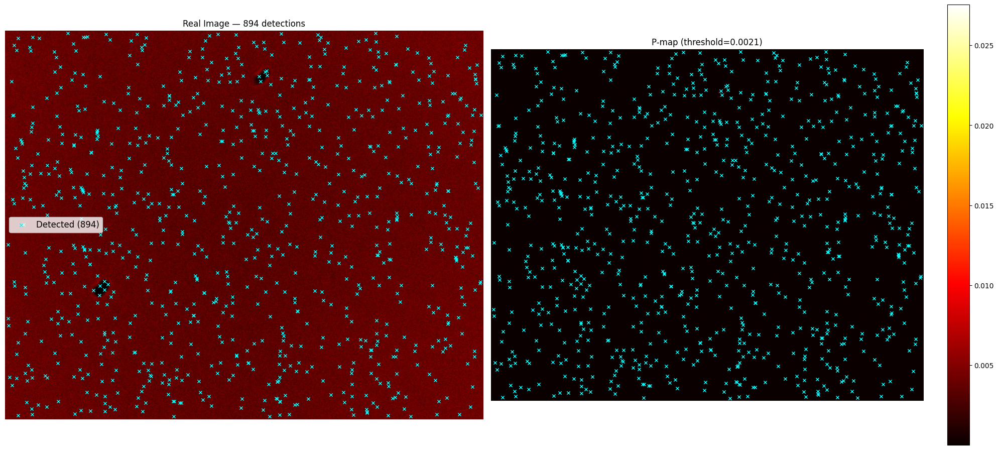

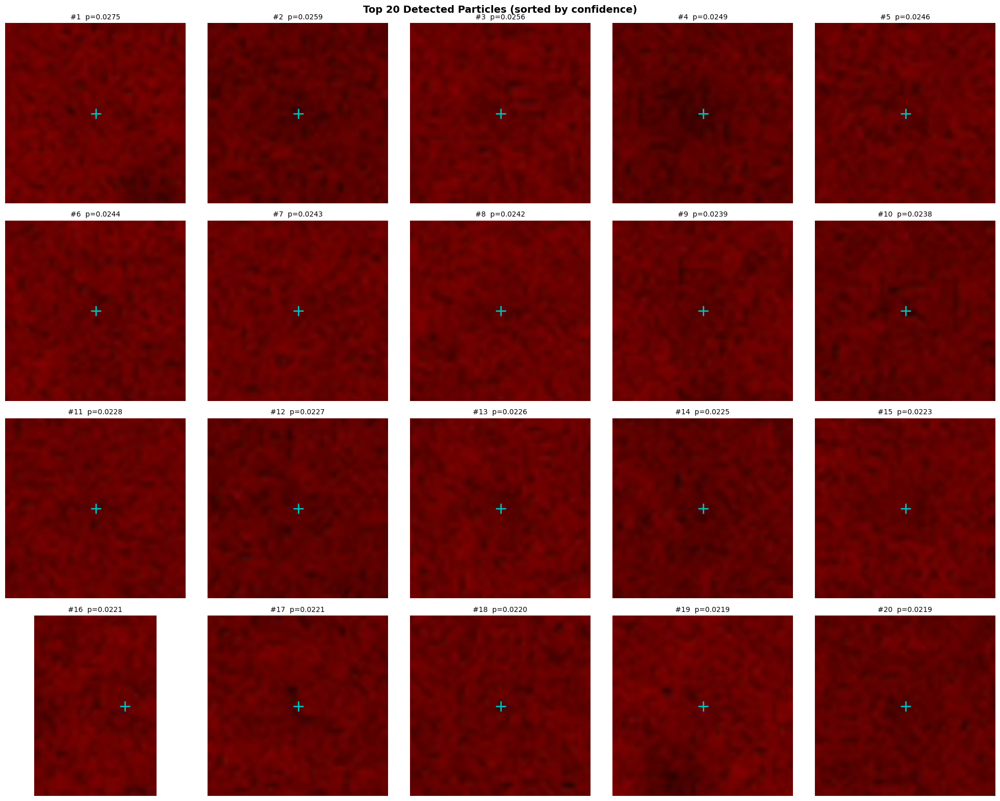

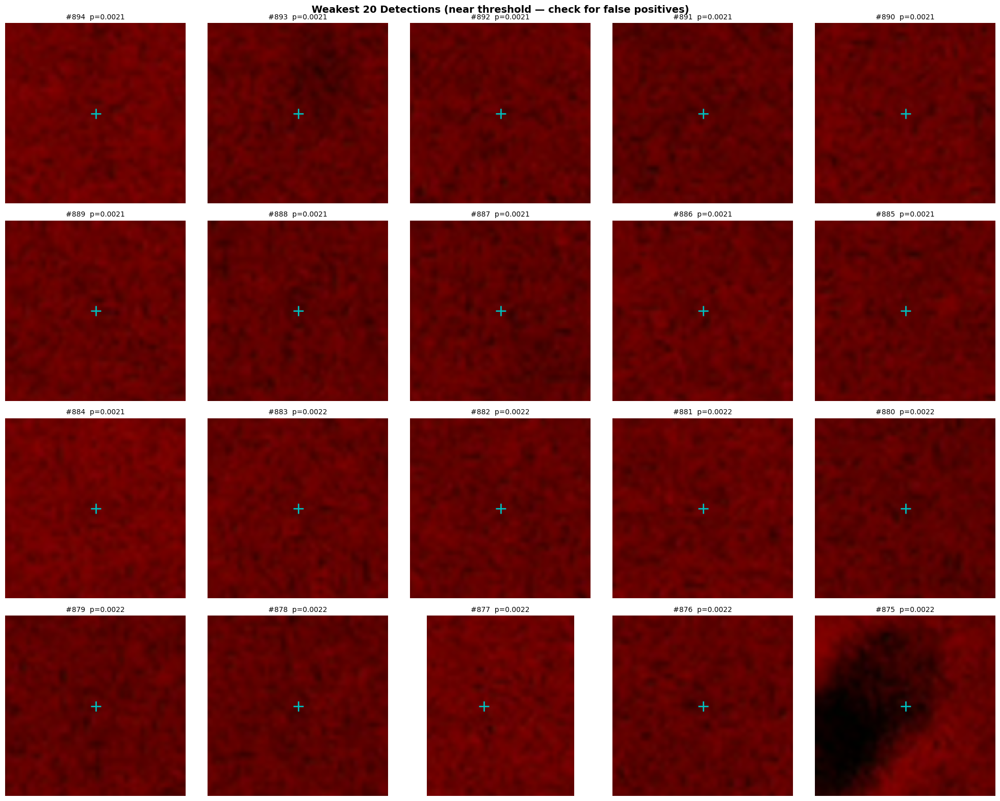

In [49]:
###############################################################################
# TEST ON REAL IMAGE
#
# - Loads a real red/black image (uses red channel for inference)
# - Displays results in original RGB color
# - Tiles into 512×512, normalizes same as training
# - Runs model, clusters detections
# - Shows 20 example detected particles with center marked
###############################################################################

import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from scipy import ndimage as ndi
import os

Image.MAX_IMAGE_PIXELS = None


def load_real_image(path):
    """Load image. If RGB (red/black), extract red channel for model. Keep RGB for display."""
    img = Image.open(path)
    arr = np.asarray(img).astype(np.float32)
    arr_rgb = arr.copy() if arr.ndim == 3 else None

    if arr.ndim == 3:
        print(f"  RGB image detected, shape: {arr.shape}")
        print(f"  Channel means: R={arr[:,:,0].mean():.1f}, "
              f"G={arr[:,:,1].mean():.1f}, B={arr[:,:,2].mean():.1f}")
        arr = arr[:, :, 0]
        print(f"  Using RED channel for inference")

    print(f"  Final shape: {arr.shape}, range: [{arr.min():.1f}, {arr.max():.1f}]")
    return arr, arr_rgb


def cluster_detections(p_map, p_threshold):
    """Connected component clustering with p-weighted centroids."""
    binary = (p_map > p_threshold).astype(np.int32)
    labeled, num_features = ndi.label(binary)

    centroids_x, centroids_y, peak_values = [], [], []
    for i in range(1, num_features + 1):
        ys, xs = np.where(labeled == i)
        weights = p_map[ys, xs]
        centroids_x.append(np.average(xs, weights=weights))
        centroids_y.append(np.average(ys, weights=weights))
        peak_values.append(weights.max())

    return (np.array(centroids_x), np.array(centroids_y),
            np.array(peak_values), labeled, num_features)


def show_image(ax, image_gray, image_rgb, y0=None, y1=None, x0=None, x1=None):
    """Helper: display RGB if available, otherwise grayscale."""
    if y0 is not None:
        if image_rgb is not None:
            ax.imshow(image_rgb[y0:y1, x0:x1], interpolation='none')
        else:
            ax.imshow(image_gray[y0:y1, x0:x1], cmap='gray', interpolation='none')
    else:
        if image_rgb is not None:
            ax.imshow(image_rgb, interpolation='none')
        else:
            ax.imshow(image_gray, cmap='gray', interpolation='none')


def test_real_image(model, device, image_path, window_size=(512, 512),
                    p_threshold=0.002, crop_size=120, num_examples=20):
    """
    Run model on a real image and show detected particles.

    Args:
        crop_size: size of the zoomed crop around each detection (in pixels)
        num_examples: number of example particles to show
    """
    model.eval()

    # --- 1. Load image ---
    print(f"Loading: {image_path}")
    image, image_rgb = load_real_image(image_path)
    h, w = image.shape

    # --- 2. Tile ---
    n_tiles_y = h // window_size[0]
    n_tiles_x = w // window_size[1]
    n_tiles = n_tiles_y * n_tiles_x
    h_crop = n_tiles_y * window_size[0]
    w_crop = n_tiles_x * window_size[1]
    image_cropped = image[:h_crop, :w_crop]
    if image_rgb is not None:
        image_rgb_cropped = (image_rgb[:h_crop, :w_crop] / 255.0).clip(0, 1)
    else:
        image_rgb_cropped = None
    print(f"  Tiling: {n_tiles_y} x {n_tiles_x} = {n_tiles} tiles")
    print(f"  Cropped to: {w_crop} x {h_crop}")

    tiles = []
    for ty in range(n_tiles_y):
        for tx in range(n_tiles_x):
            tile = image_cropped[ty * window_size[0]: (ty + 1) * window_size[0],
                                  tx * window_size[1]: (tx + 1) * window_size[1]]
            std = np.std(tile)
            if std == 0:
                std = 1
            tile = (tile - np.mean(tile)) / std
            tiles.append(tile)

    tiles_tensor = torch.from_numpy(np.array(tiles)).float().unsqueeze(1)

    # --- 3. Inference ---
    print("Running inference...")
    p_list, pxy_mean_list = [], []
    with torch.no_grad():
        for i in range(tiles_tensor.shape[0]):
            single_tile = tiles_tensor[i:i + 1].to(device)
            p_i, pxy_mean_i, _, _ = model(single_tile, training=False)
            p_list.append(p_i.cpu())
            pxy_mean_list.append(pxy_mean_i[:, [0, 1], ...].cpu())

    p = torch.cat(p_list, dim=0)
    pxy_mean_np = torch.cat(pxy_mean_list, dim=0).numpy()

    # --- 4. Stitch p-map ---
    _, _, p_h, p_w = p.shape
    p_full = np.zeros((n_tiles_y * p_h, n_tiles_x * p_w), dtype=np.float32)
    for i in range(p.shape[0]):
        ty = i // n_tiles_x
        tx = i % n_tiles_x
        p_full[ty * p_h:(ty + 1) * p_h,
               tx * p_w:(tx + 1) * p_w] = p[i, 0, ...].cpu().numpy()

    # --- 5. Cluster ---
    det_x, det_y, peak_vals, labeled, num_clusters = cluster_detections(
        p_full, p_threshold)

    # Sub-pixel refinement
    refined_x, refined_y = det_x.copy(), det_y.copy()
    for i in range(len(det_x)):
        px = int(np.clip(round(det_x[i]), 0, p_full.shape[1] - 1))
        py = int(np.clip(round(det_y[i]), 0, p_full.shape[0] - 1))
        ti_y, ti_x = py // p_h, px // p_w
        ti = ti_y * n_tiles_x + ti_x
        ly, lx = py % p_h, px % p_w
        if ti < pxy_mean_np.shape[0]:
            refined_x[i] = px + pxy_mean_np[ti, 0, ly, lx]
            refined_y[i] = py + pxy_mean_np[ti, 1, ly, lx]

    print(f"  Detected: {num_clusters} particles (threshold={p_threshold})")

    # --- Save annotated image ---
    if image_rgb is not None:
        annotated = image_rgb.copy()  # uint8 range 0-255
    else:
        annotated = np.stack([image_cropped]*3, axis=-1)

    for i in range(len(refined_x)):
        cx = int(round(refined_x[i]))
        cy = int(round(refined_y[i]))
        for dy in range(-1, 2):
            for dx in range(-1, 2):
                py, px = cy + dy, cx + dx
                if 0 <= py < annotated.shape[0] and 0 <= px < annotated.shape[1]:
                    annotated[py, px] = [0, 255, 255]  # cyan

    save_path = os.path.splitext(image_path)[0] + '_detections.png'
    Image.fromarray(annotated.astype(np.uint8)).save(save_path)
    print(f"  Saved annotated image: {save_path}")

    # --- 6. Full image overview ---
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    show_image(axes[0], image_cropped, image_rgb_cropped)
    axes[0].scatter(refined_x, refined_y, color='cyan', marker='x', s=20,
                    linewidths=1, label=f'Detected ({num_clusters})')
    axes[0].legend(fontsize=12)
    axes[0].set_title(f'Real Image — {num_clusters} detections')
    axes[0].axis('off')

    im = axes[1].imshow(p_full, cmap='hot', interpolation='none')
    axes[1].scatter(refined_x, refined_y, color='cyan', marker='x', s=20,
                    linewidths=1)
    axes[1].set_title(f'P-map (threshold={p_threshold})')
    axes[1].axis('off')
    fig.colorbar(im, ax=axes[1], fraction=0.046)

    plt.tight_layout()
    plt.show()

    # --- 7. Example particle crops (strongest) ---
    sort_idx = np.argsort(peak_vals)[::-1]
    n_show = min(num_examples, len(sort_idx))

    cols = 5
    rows = (n_show + cols - 1) // cols
    fig, axes_grid = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes_flat = axes_grid.flatten()

    half = crop_size // 2

    for i in range(n_show):
        idx = sort_idx[i]
        cx = refined_x[idx]
        cy = refined_y[idx]

        y0 = int(max(0, cy - half))
        y1 = int(min(h_crop, cy + half))
        x0 = int(max(0, cx - half))
        x1 = int(min(w_crop, cx + half))

        mark_x = cx - x0
        mark_y = cy - y0

        show_image(axes_flat[i], image_cropped, image_rgb_cropped, y0, y1, x0, x1)
        axes_flat[i].plot(mark_x, mark_y, 'c+', markersize=15, markeredgewidth=2)
        axes_flat[i].set_title(f'#{i+1}  p={peak_vals[idx]:.4f}', fontsize=10)
        axes_flat[i].axis('off')

    for i in range(n_show, len(axes_flat)):
        axes_flat[i].axis('off')

    plt.suptitle(f'Top {n_show} Detected Particles (sorted by confidence)',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # --- 8. Weakest detections ---
    n_weak = min(num_examples, len(sort_idx))
    fig, axes_grid = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes_flat = axes_grid.flatten()

    for i in range(n_weak):
        idx = sort_idx[-(i + 1)]
        cx = refined_x[idx]
        cy = refined_y[idx]

        y0 = int(max(0, cy - half))
        y1 = int(min(h_crop, cy + half))
        x0 = int(max(0, cx - half))
        x1 = int(min(w_crop, cx + half))

        mark_x = cx - x0
        mark_y = cy - y0

        show_image(axes_flat[i], image_cropped, image_rgb_cropped, y0, y1, x0, x1)
        axes_flat[i].plot(mark_x, mark_y, 'c+', markersize=15, markeredgewidth=2)
        axes_flat[i].set_title(f'#{len(sort_idx)-i}  p={peak_vals[idx]:.4f}', fontsize=10)
        axes_flat[i].axis('off')

    for i in range(n_weak, len(axes_flat)):
        axes_flat[i].axis('off')

    plt.suptitle(f'Weakest {n_weak} Detections (near threshold — check for false positives)',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

    return p_full, num_clusters, (refined_x, refined_y), peak_vals


# =============================================================================
# RUN
# =============================================================================
if __name__ == '__main__':
    in_channel = 1
    window_size = (512, 512)

    # Load model
    model = GaussianMixtureModel(num_channels=in_channel)
    model_path = os.path.join(os.getcwd(), 'final_v2.pth')
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print(f"Loading model from: {model_path}")
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    print(f"Device: {device}")

    # Path to real image
    real_image_path = os.path.join(os.getcwd(), 'cropped_center.png')

    # Run
    p_map, count, positions, peaks = test_real_image(
        model=model,
        device=device,
        image_path=real_image_path,
        window_size=window_size,
        p_threshold=0.0021,
        crop_size=250,
        num_examples=20,
    )